In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras.models import load_model
import matplotlib.patches as mpatches
from city_sustainability.models import unet_model
from city_sustainability.quality import life_quality
from city_sustainability.preprocessing import image_resize
from city_sustainability.loading_data import loading_paths
from matplotlib.colors import ListedColormap, BoundaryNorm
from city_sustainability.models.unet_model import compute_iou
from city_sustainability.loading_data import image_and_label_arrays

2023-05-29 20:55:21.686028: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-05-29 20:55:22.000328: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-05-29 20:55:22.001937: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-29 20:55:22.997804: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
# Retrieve image_paths and label_paths
data_path = '../../raw_data/OpenEarthMap_wo_xBD'
image_paths, label_paths = loading_paths(data_path)

In [3]:
# Import all image array as X and label array as y
X, y = image_and_label_arrays(image_paths, label_paths, sampling_ratio=0.5)

In [4]:
# Apply holdout
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3)

In [5]:
# Scale X and y
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [6]:
X_train_scaled.shape

(940, 448, 448, 3)

In [7]:
X_test_scaled.shape

(404, 448, 448, 3)

In [14]:
path = '../../model_training/marcel/20230529-06-unet_vgg16full_1.00img_16epch_64btch_0.57acc'
model = load_model(path, custom_objects={'compute_iou': compute_iou})

In [15]:
y_pred = model.predict(X_test_scaled)

13/13 [==============================] - 181s 14s/step


In [20]:
y_pred.shape

(404, 448, 448, 9)

In [12]:
# Create a DataFrame from your color dictionary
df = pd.DataFrame(list(class_colors.items()), columns=['Class', 'Color'])
def color_cells(val):
    color = val 
    return 'background-color: %s' % color
class_color = df.style.applymap(color_cells, subset=['Color'])
class_color

,Class,Color
0,Other,#FFFF00
1,Bareland,#800000
2,Rangeland,#00FF24
3,Developed space,#949494
4,Road,#FFFFFF
5,Tree,#226126
6,Water,#0045FF
7,Agriculture land,#4BB549
8,Building,#DE1F07


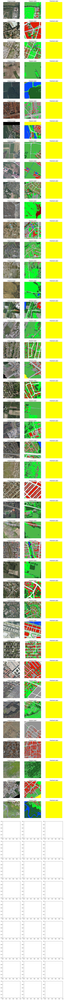

In [21]:
# Create Numpy
y_pred_np = np.argmax(y_pred, axis=-1)
y_test_np = np.argmax(y_test, axis=-1)

# Defining classes colors
class_colors = {
    "Other": '#FFFF00',
    "Bareland": '#800000',
    "Rangeland": '#00FF24',
    "Developed space": '#949494',
    "Road": '#FFFFFF',
    "Tree": '#226126',
    "Water": '#0045FF',
    "Agriculture land": '#4BB549',
    "Building": '#DE1F07'}

labels = list(range(len(class_colors))) 
colors = list(class_colors.values())     
cmap = ListedColormap(colors)
norm = BoundaryNorm(labels, cmap.N)

# Create the figure and subplots
num_images = 50 
fig, axs = plt.subplots(num_images, 3, figsize=(12, 4*num_images))

# Iterate through the image sets
for i in range(num_images):
    index = i * 10  
    if index >= len(X_test):
        break
    # Display the original image
    axs[i, 0].imshow(X_test[index])
    axs[i, 0].set_title('Original Image')
    axs[i, 0].axis('off')
    # Display the original label
    axs[i, 1].imshow(y_test_np[index], cmap=cmap, vmin=0, vmax=8)
    axs[i, 1].set_title('Original Label')
    axs[i, 1].axis('off')
    # Display the predicted label
    axs[i, 2].imshow(y_pred_np[index], cmap=cmap, vmin=0, vmax=8)
    axs[i, 2].set_title('Predicted Label')
    axs[i, 2].axis('off')

# Display the figure and adjust the spacing between subplots
plt.subplots_adjust(wspace=0.2, hspace=0.2)
plt.show()